1. ref - https://colab.research.google.com/github/theislab/scvelo_notebooks/blob/master/VelocityBasics.ipynb#scrollTo=nt8QO3Bhhmrb
2. ref - https://towardsdatascience.com/rna-velocity-the-cells-internal-compass-cf8d75bb2f89
3. ref - https://www.kallistobus.tools/tutorials/kb_velocity/python/kb_velocity/
4. ref - https://github.com/basilkhuder/Seurat-to-RNA-Velocity
5. ref - https://github.com/quadbiolab/scRNAseq_analysis_vignette
6. Dataset from dynamo paper - https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE193517 
7. tutorial - https://uci-genpals.github.io/pseudotime/2021/02/09/scvelo-tutorial.html

## DATASETS
1. Tutorial - dataset - neutrophils - https://www.10xgenomics.com/resources/analysis-guides/trajectory-analysis-using-10x-Genomics-single-cell-gene-expression-data
2. Dataset - Human neural stem cells - https://zenodo.org/record/5712100#.Yl94T_PMJhE, paper - https://www.embopress.org/doi/full/10.15252/msb.20209522

that while the exonic transcriptome represents the current state of a cell, the intronic transcriptome represents what the cell is going to be in the near future. By introducing a transcriptional dynamic model, RNA velocity analysis predicts the directional 'flow' of cell state transition, which greatly expands the application of scRNA-seq to capture dynamics of molecular changes. Fabian Theis's lab further improved the method by introducing a better transcriptional dynamic model and implemented scVelo

In [3]:
#- mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#- get scvelo and matplotlib specific version (dependency)
!pip install scvelo --upgrade --quiet
!pip install matplotlib==3.0.3

     |████████████████████████████████| 196 kB 5.4 MB/s 
     |████████████████████████████████| 11.2 MB 47.2 MB/s 
     |████████████████████████████████| 2.0 MB 35.7 MB/s 
     |████████████████████████████████| 96 kB 4.8 MB/s 
     |████████████████████████████████| 88 kB 6.8 MB/s 
     |████████████████████████████████| 4.8 MB 33.8 MB/s 
     |████████████████████████████████| 48 kB 4.6 MB/s 
     |████████████████████████████████| 930 kB 42.3 MB/s 
     |████████████████████████████████| 1.1 MB 37.9 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 13.0 MB 5.0 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.5.1
    Unin

In [5]:
#- import packages 1
import os
import scvelo as scv
scv.logging.print_version()
scv.settings.verbosity = 3  #- show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  #- set max width size for presenter view
scv.settings.set_figure_params('scvelo')  #- for beautified visualization

Running scvelo 0.2.4 (python 3.7.13) on 2022-04-27 01:35.


In [6]:
#- install other packages useful for velocity analysis
!pip install scanpy loompy anndata velocyto python-igraph louvain --quiet

     |████████████████████████████████| 198 kB 4.8 MB/s 
     |████████████████████████████████| 1.1 MB 46.3 MB/s 
     |████████████████████████████████| 15.0 MB 27.5 MB/s 
     |████████████████████████████████| 3.1 MB 34.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
#- sometimes an error of this package dependency pops up
# pip install cffi==1.15.0

In [7]:
#- import packages 2
import anndata
import igraph
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rpy2.robjects as robj
import scanpy as sc
import scipy
import scipy.optimize
import sklearn
import velocyto as ve

In [7]:
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)


HUMAN NEURAL STEM CELLS (external dataset)

In [8]:
#- read spliced loom object for human neural stem cells
adata_s = scv.read_loom('hNSC/U5_all_v3.loom')
adata_s

AnnData object with n_obs × n_vars = 3049 × 32738
    obs: 'ClusterID', 'ClusterName', 'clusts_WT', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'orig_ident', 'percent_mito', 'pert'
    var: 'Selected'
    obsm: 'pca_cell_embeddings', 'umap_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data'

In [9]:
#- read unspliced loom object for human neural stem cells
adata_uns = scv.read_loom('hNSC/U5_velocyto.loom')
adata_uns

AnnData object with n_obs × n_vars = 3049 × 32738
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [10]:
#- TSNE embeddings 
ccAF1_tsne = pd.read_csv('hNSC/tsne_cell_embeddings_Perplexity_26.csv', header = 0, index_col = 0)

#- Import the TSNE embeddings
adata_s.obsm['tsne_cell_embeddings'] = np.array(ccAF1_tsne.loc[adata_s.obs_names])
adata_s.obsm

AxisArrays with keys: pca_cell_embeddings, umap_cell_embeddings, tsne_cell_embeddings

In [ ]:
#- Merge data of both the adata's
adata_hnsc = scv.utils.merge(adata_s, adata_uns)

#- got cell cycle information here as well
#- Change G1/Differentiation to Neural G0, and change order of clusters (recommended)
adata_hnsc.obs.clusts_WT = adata_hnsc.obs.clusts_WT.astype('category')
adata_hnsc.obs.clusts_WT = adata_hnsc.obs.clusts_WT.cat.rename_categories({'G1/Differentiation':'Neural G0'})
adata_hnsc.obs.clusts_WT = adata_hnsc.obs.clusts_WT.cat.reorder_categories(['G1/other', 'Neural G0', 'G1', 'Late G1', 'S', 'S/G2', 'G2/M', 'M/Early G1'], ordered=True)

adata_hnsc.obs.head(4)

In [ ]:
!pip install matplotlib==3.0.3 #- needs a specific plt version for the plots to show up

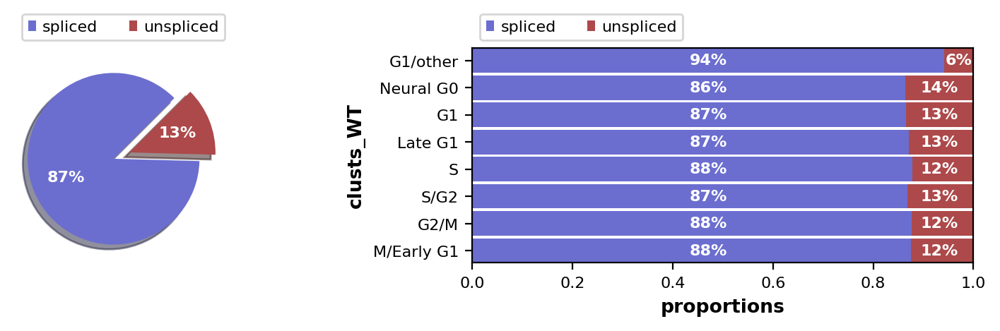

In [13]:
#- The proportions of spliced/unspliced counts are displayed
#- Depending on sequencing technology, we typically expect 10%-25% of unspliced molecules containing intronic sequences
adata_hnsc
scv.pl.proportions(adata_hnsc, groupby='clusts_WT')

In [15]:
adata_hnsc

AnnData object with n_obs × n_vars = 3049 × 32624
    obs: 'ClusterID', 'ClusterName', 'clusts_WT', 'nCount_RNA', 'nFeature_RNA', 'nGene', 'nUMI', 'orig_ident', 'percent_mito', 'pert', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Selected', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'pca_cell_embeddings', 'umap_cell_embeddings', 'tsne_cell_embeddings'
    varm: 'pca_feature_loadings'
    layers: 'norm_data', 'scale_data', 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [16]:
#- preprocess data
#- filter and normalize - select genes by minimum number of counts and dispersion normalizing every cell by its total size and logarithmizing it.
#- Further, we need the first and second order moments (means and uncentered variances) computed among nearest neighbors in PCA space, summarized in scv.pp.moments, which internally computes scv.pp.pca and scv.pp.neighbors. 
#- First order is needed for deterministic velocity estimation, while stochastic estimation also requires second order moments.
#- if the datasets are already preprocessed then it skips it intrinsically
scv.pp.filter_and_normalize(adata_hnsc, min_shared_counts=20, n_top_genes=2000) #- just using default metrics
scv.pp.moments(adata_hnsc, n_pcs=30, n_neighbors=30)

Filtered out 28325 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:21) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [17]:
#- Estimate RNA velocity now (ratio of unspliced/splcied mRNA); -ve Velocity = downregulated genes
#- They represent direction and speed of movement of individual cells - hence applied to single cell RNA seq datasets
#- Can be STOCHASTICALLY (mode="stochastic") | DETERMINISTCIALLY (mode="deterministic") | DYNAMICAL (mode="dynamical")
scv.tl.velocity(adata_hnsc, mode="stochastic")

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [20]:
scv.tl.velocity_graph(adata_hnsc)

computing velocity graph (using 1/2 cores)


  0%|          | 0/3049 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [18]:
adata_hnsc.obs.head(3)

,ClusterID,ClusterName,clusts_WT,nCount_RNA,nFeature_RNA,nGene,nUMI,orig_ident,percent_mito,pert,Clusters,_X,_Y,initial_size_spliced,initial_size_unspliced,initial_size,n_counts
AAACATACTAACCG,1,G1,G1,3147.0,1466,1466,3147.0,SeuratProject,0.052749,WT,5,-20.154554,-4.426001,2347,434,2347.0,4559.149414
AAACATTGAGTTCG,2,G1/Differentiation,Neural G0,7622.0,2655,2655,7622.0,SeuratProject,0.026109,WT,4,-23.852295,-18.772135,5756,721,5756.0,4722.341797
AAACATTGCACTGA,8,S/G2,S/G2,7299.0,2618,2618,7299.0,SeuratProject,0.026853,WT,6,-5.118975,51.188499,5539,1025,5539.0,4699.582520


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


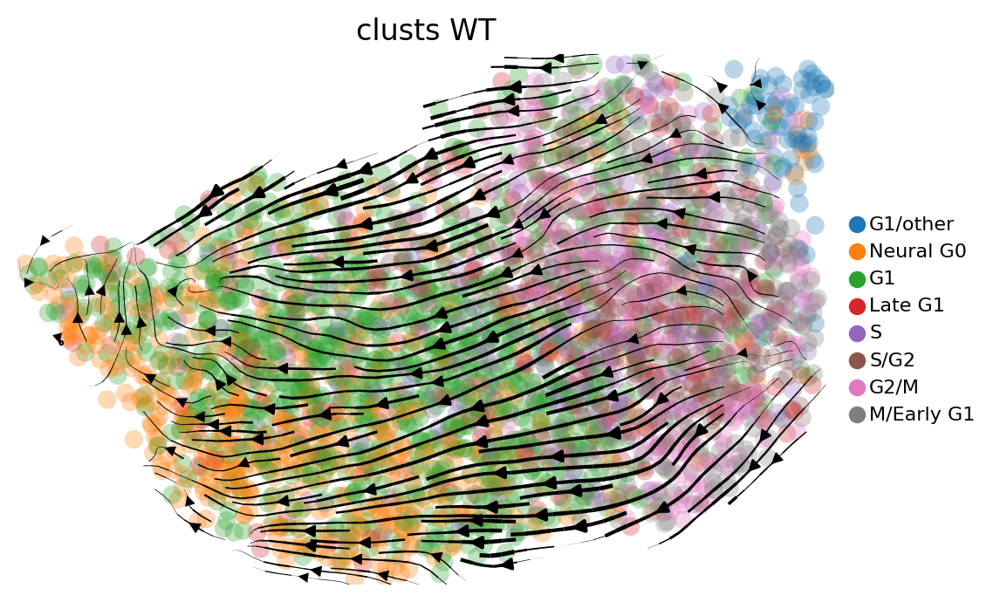

In [21]:
#- clustering and embedding (get UMAP embeddings and annotated clusters)
scv.tl.umap(adata_hnsc)
scv.tl.louvain(adata_hnsc)
scv.pl.velocity_embedding_stream(adata_hnsc, basis='umap', 
                                 color='clusts_WT', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')

In [22]:
#- INTERPRET the velocity estimates by identifying important/top genes - PHASE PORTRAITS of some markers
scv.tl.rank_velocity_genes(adata_hnsc, groupby='clusts_WT', min_corr=.3)

df = scv.DataFrame(adata_hnsc.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,G1/other,Neural G0,G1,Late G1,S,S/G2,G2/M,M/Early G1
0,CALD1,LRRC4C,SAT1,TMEFF2,NCAPG,NEIL3,IGFBP5,IGFBP5
1,LMNA,COL11A1,PPP2R2B,AKAP12,DCBLD2,ANLN,NEIL3,TROAP
2,SNRPB,CITED1,CENPK,KCNIP1,ANLN,KIF4A,KPNA2,LHFP
3,TK1,CSGALNACT1,CSGALNACT1,DCBLD2,KIF11,CENPE,NCAPD2,CENPW
4,TPM1,AKAP12,LRRC4C,ATAD2,SPC25,PRC1,CENPA,CCNB1


In [ ]:
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)
df.to_csv("hNSC/rank_velocity_genes_hNSC.csv", sep='\t')

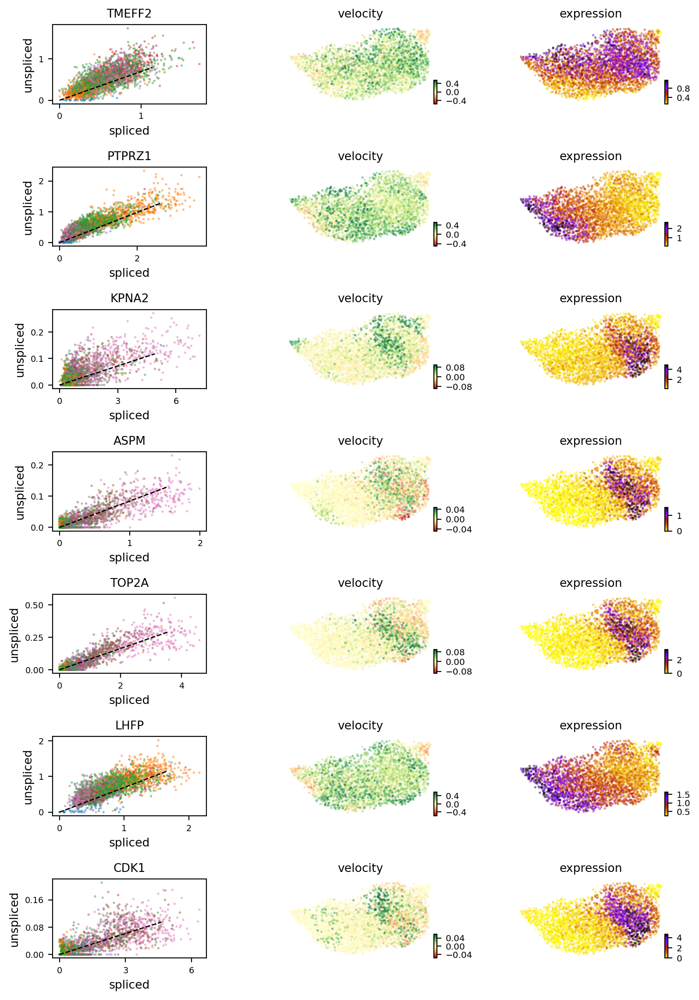

In [25]:
#- phase portraits of genes in the G1 phase which show up in the p53 signalling pathway (according to PANTHER db)
scv.pl.velocity(adata_hnsc, ['TMEFF2',  'PTPRZ1', 'KPNA2', 'ASPM', 'TOP2A', 'LHFP', 'CDK1'], ncols=1, color = 'clusts_WT', colorbar=True)

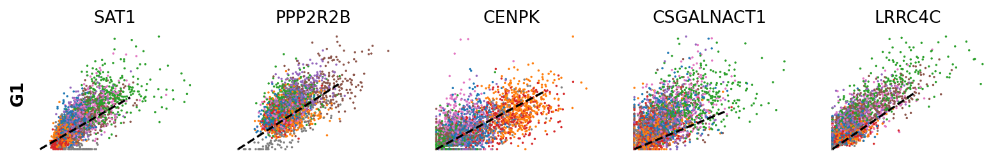

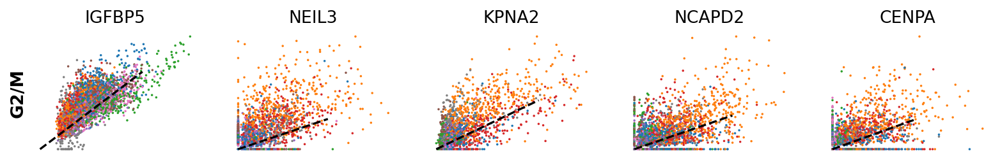

In [ ]:
kwargs = dict(frameon=False, size=10, linewidth=1.5, 
              add_outline='G1 , S, G2/M')

scv.pl.scatter(adata_hnsc, df['G1'][:5], ylabel='G1', **kwargs)
scv.pl.scatter(adata_hnsc, df['G2/M'][:5], ylabel='G2/M', **kwargs)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


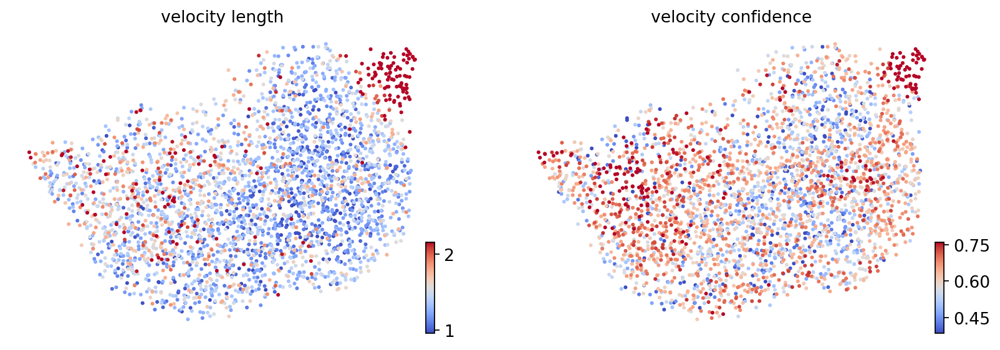

In [ ]:
#- speed (by length of velocity vector) and coherence - how a velocity vector correlates with its neighboring velocities, provides a measure of confidence.
scv.tl.velocity_confidence(adata_hnsc)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_hnsc, c=keys, cmap='coolwarm', perc=[5, 95], colorbar=True)

In [ ]:
df1 = adata_hnsc.obs.groupby('clusts_WT')[keys].mean().T
df1.style.background_gradient(cmap='coolwarm', axis=1)

clusts_WT,G1/other,Neural G0,G1,Late G1,S,S/G2,G2/M,M/Early G1
velocity_length,3.363947,1.507628,1.419545,1.451633,1.368037,1.304428,1.261703,1.392656
velocity_confidence,0.764893,0.600738,0.592971,0.585594,0.578008,0.592013,0.539647,0.580121


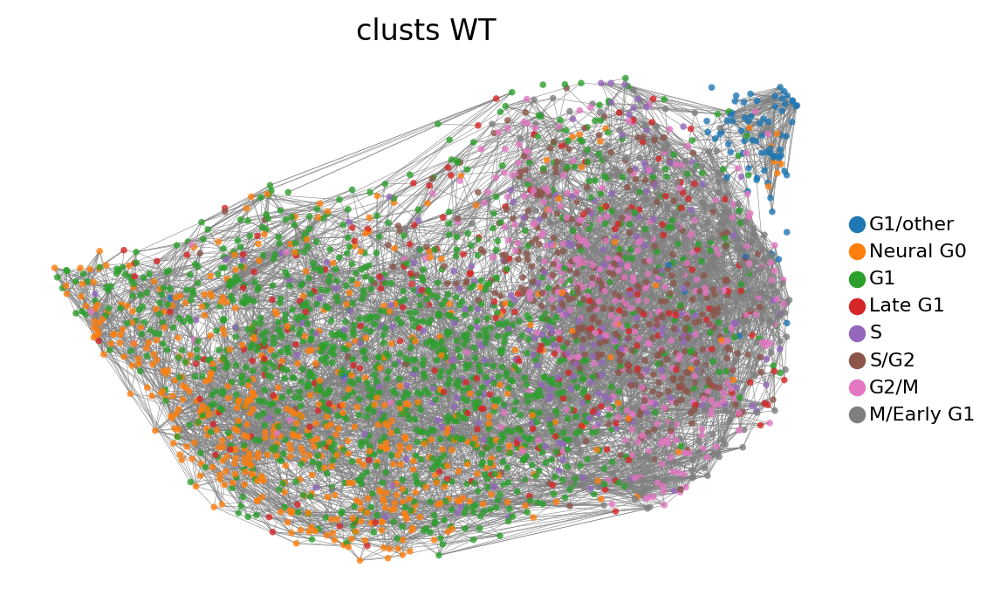

In [ ]:
#- velocity graph to portray all velocity-inferred cell-to-cell connections/transitions
scv.pl.velocity_graph(adata_hnsc, threshold=.2, color='clusts_WT', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

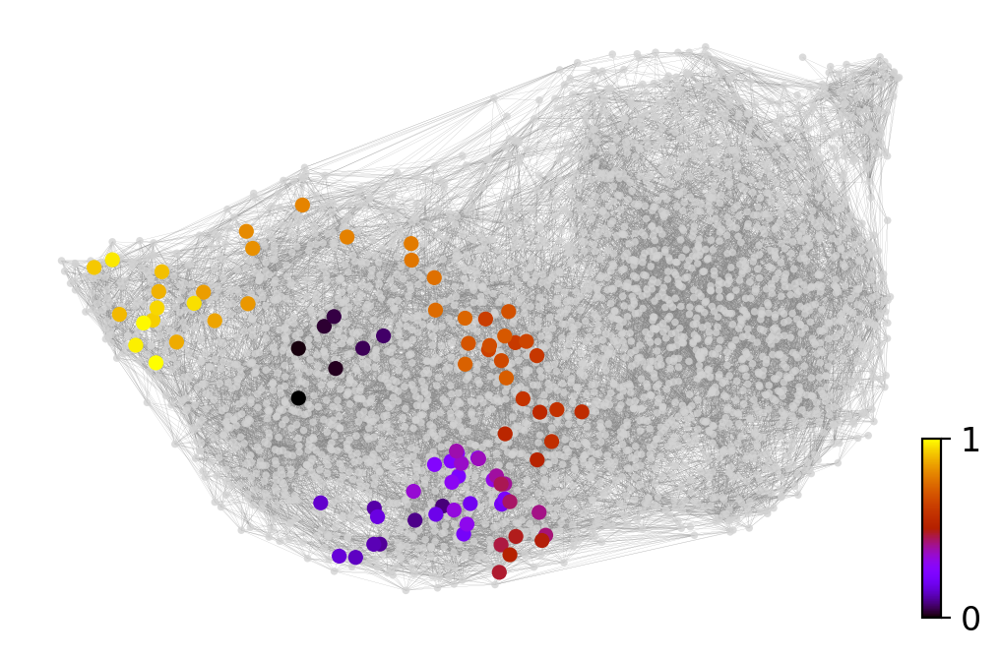

In [ ]:
#- Further, the graph can be used to draw descendents/anscestors coming from a specified cell - neural G0
x, y = scv.utils.get_cell_transitions(adata_hnsc, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata_hnsc, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_hnsc, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [ ]:
#- PAGA velocity graph - gives velocity-inferred directionality
!pip install python-igraph --upgrade --quiet

In [ ]:
# this is needed due to a current bug - bugfix is coming soon.
adata_hnsc.uns['neighbors']['distances'] = adata_hnsc.obsp['distances']
adata_hnsc.uns['neighbors']['connectivities'] = adata_hnsc.obsp['connectivities']

scv.tl.paga(adata_hnsc, groups='clusts_WT')
df2 = scv.get_df(adata_hnsc, 'paga/transitions_confidence', precision=2).T
df2.style.background_gradient(cmap='Blues').format('{:.2g}')


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:02) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7
0,0,0,0,0,0,0,0.091,0
1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0.27,0,0,0,0,0,0
4,0,0,0.57,0,0,0,0,0
5,0,0,0,0,0.37,0,0,0
6,0,0,0.33,0,0,0,0,0
7,0,0,0.63,0.25,0,0,0,0


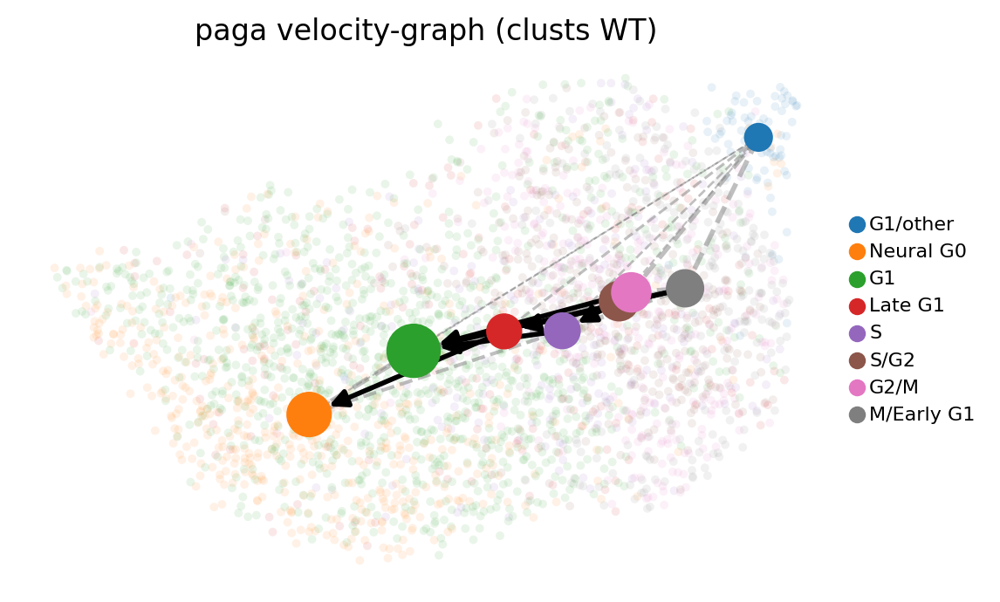

In [ ]:
scv.pl.paga(adata_hnsc, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, threshold=.2, color='clusts_WT', 
            xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

In [ ]:
#- DYNAMICAL model - to learn the full transcriptional dynamics of splicing kinetics
# - can take long to run
scv.tl.recover_dynamics(adata_hnsc)
scv.tl.velocity(adata_hnsc, mode="dynamical")

recovering dynamics (using 1/2 cores)


  0%|          | 0/138 [00:00<?, ?gene/s]

    finished (0:01:56) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [ ]:
scv.tl.velocity_graph(adata_hnsc)

computing velocity graph (using 1/2 cores)


  0%|          | 0/3049 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
adata_hnsc.write('hNSC/hNSC_dynamical_model.h5ad')

computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


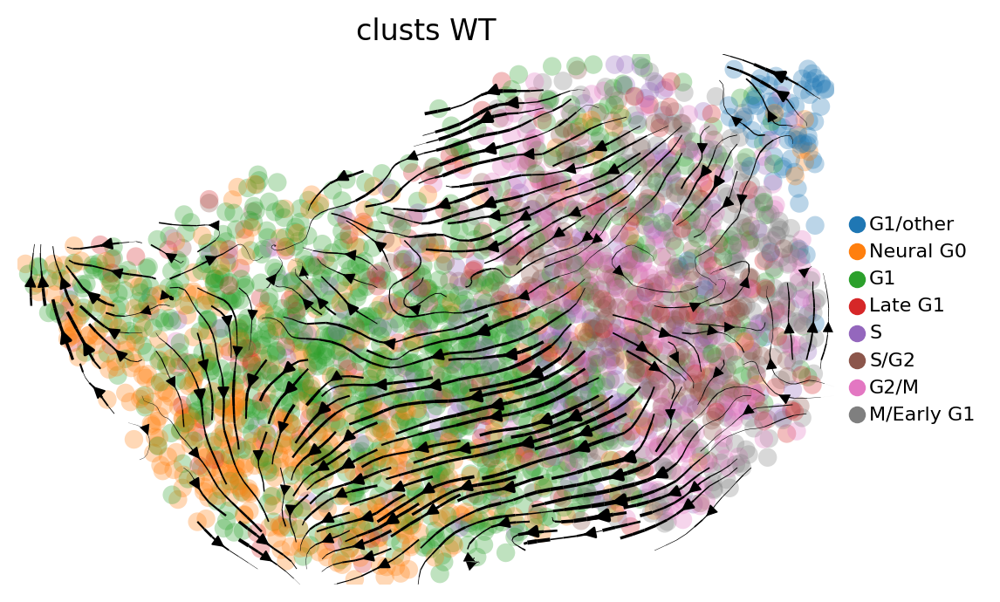

In [ ]:
scv.pl.velocity_embedding_stream(adata_hnsc, basis='umap', 
                                 color='clusts_WT', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')


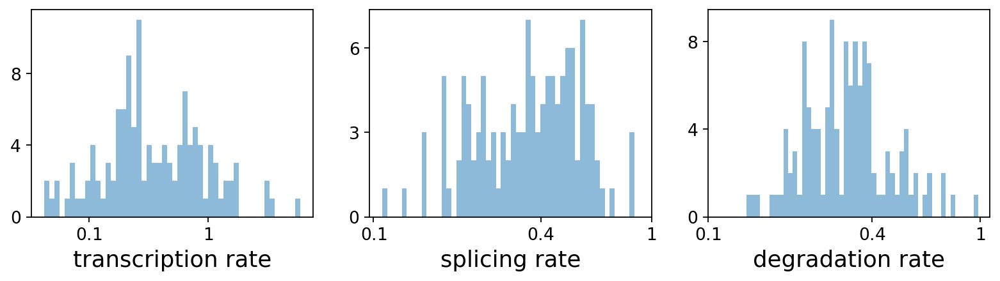

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
CLSPN,0.46,3.61,0.33,6.97,0.07,0.04,0.25,0.22,0.0,0.0,0.42,0.11,0.61,0.72,1.78,0.33
CDCA8,0.59,3.36,0.65,4.80,0.11,0.05,0.20,0.28,0.0,0.0,0.41,0.14,0.50,0.65,1.21,0.68
KIF2C,0.49,3.66,0.62,4.54,0.09,0.03,0.16,0.23,0.0,0.0,0.38,0.10,0.44,0.90,1.37,0.62
DEPDC1,0.90,8.20,0.58,4.21,0.04,0.03,0.28,0.27,0.0,0.0,0.43,0.08,0.68,0.67,1.28,0.65
NEXN,0.27,1.98,0.29,9.82,0.29,0.05,0.22,0.22,0.0,0.0,0.31,0.14,0.77,1.10,2.23,0.15


In [ ]:
#- kinetic rate parameters
df4 = adata_hnsc.var
df4 = df4[(df4['fit_likelihood'] > .1) & df4['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df4['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df4['fit_beta'] * df4['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)    
    pl.hist(df4['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    
scv.get_df(adata_hnsc, 'fit*', dropna=True).head()

computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


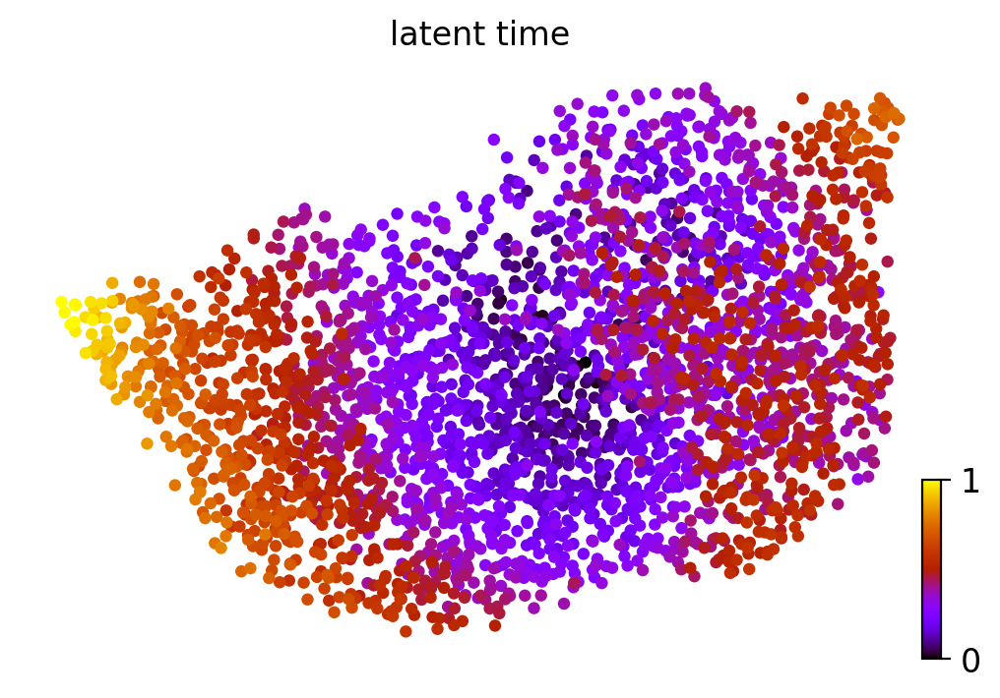

In [ ]:
#- latent time
scv.tl.latent_time(adata_hnsc)
scv.pl.scatter(adata_hnsc, color='latent_time', color_map='gnuplot', size=80)


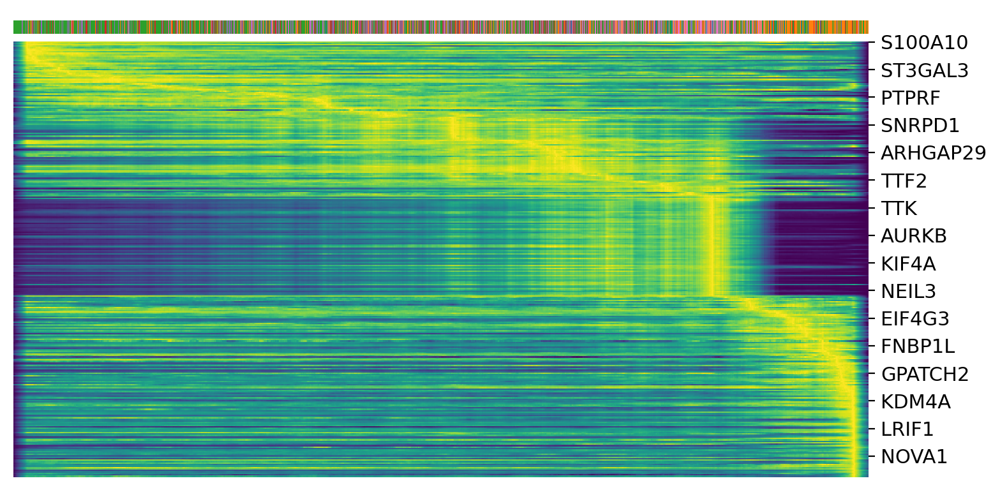

In [ ]:
top_genes = adata_hnsc.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_hnsc, var_names=top_genes, sortby='latent_time', col_color='clusts_WT', n_convolve=100)


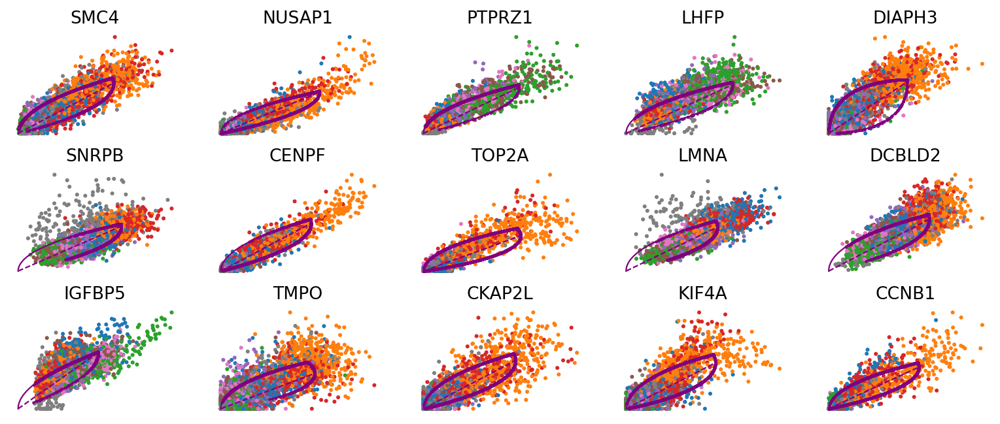

In [ ]:
top_genes = adata_hnsc.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_hnsc, basis=top_genes[:15], ncols=5, frameon=False)


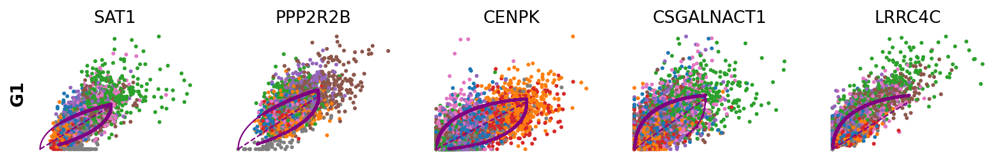

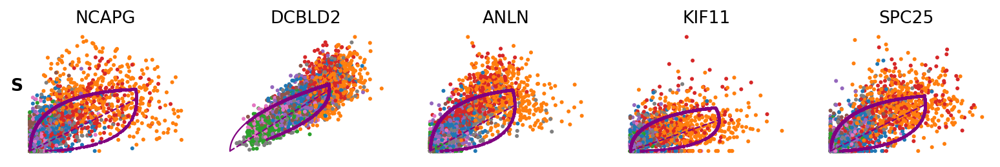

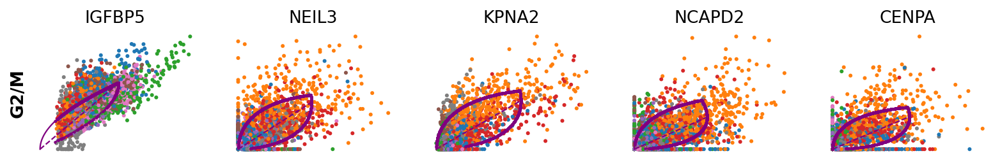

In [ ]:
for cluster in ['G1', 'S', 'G2/M']:
    scv.pl.scatter(adata_hnsc, df[cluster][:5], ylabel=cluster, frameon=False)

DENTATE GYRUS from SCVELO


In [26]:
adata_dent = scv.datasets.dentategyrus()
adata_dent

AnnData object with n_obs × n_vars = 2930 × 13913
    obs: 'clusters', 'age(days)', 'clusters_enlarged'
    uns: 'clusters_colors'
    obsm: 'X_umap'
    layers: 'ambiguous', 'spliced', 'unspliced'

In [27]:
#- unique cell type clusters
adata_dent.obs.clusters.unique()

['Granule immature', 'Radial Glia-like', 'Granule mature', 'Neuroblast', 'Microglia', ..., 'Endothelial', 'Astrocytes', 'OL', 'Mossy', 'nIPC']
Length: 14
Categories (14, object): ['Astrocytes', 'Cajal Retzius', 'Cck-Tox', 'Endothelial', ..., 'OL', 'OPC',
                          'Radial Glia-like', 'nIPC']

In [ ]:
!pip install matplotlib==3.0.3 --quiet #- needs a specific plt version for the plots to show up

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scvelo 0.2.4 requires matplotlib>=3.3.0, but you have matplotlib 3.0.3 which is incompatible.
scanpy 1.9.1 requires matplotlib>=3.4, but you have matplotlib 3.0.3 which is incompatible.
plotnine 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 3.0.3 which is incompatible.
mizani 0.6.0 requires matplotlib>=3.1.1, but you have matplotlib 3.0.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


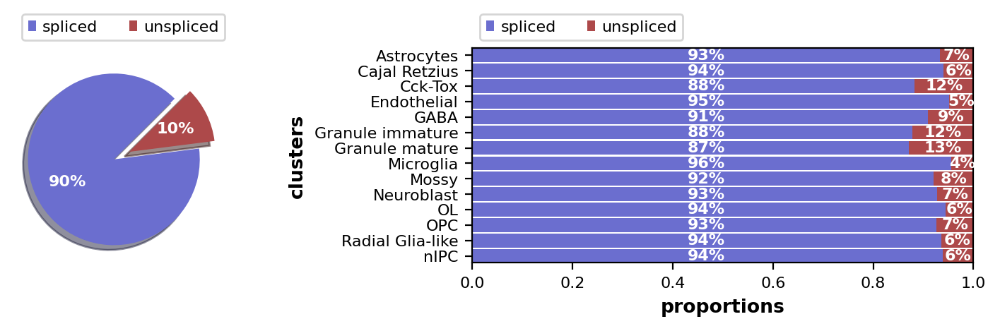

In [28]:
#- The proportions of spliced/unspliced counts are displayed
#- Depending on sequencing technology, we typically expect 10%-25% of unspliced molecules containing intronic sequences
scv.pl.proportions(adata_dent, groupby='clusters')

In [29]:
#- preprocess data
#- filter and normalize - select genes by minimum number of counts and dispersion normalizing every cell by its total size and logarithmizing it.
#- Further, we need the first and second order moments (means and uncentered variances) computed among nearest neighbors in PCA space, summarized in scv.pp.moments, which internally computes scv.pp.pca and scv.pp.neighbors. 
#- First order is needed for deterministic velocity estimation, while stochastic estimation also requires second order moments.
#- if the datasets are already preprocessed then it skips it intrinsically
scv.pp.filter_and_normalize(adata_dent, min_shared_counts=20, n_top_genes=2000) #- just using default metrics
scv.pp.moments(adata_dent, n_pcs=30, n_neighbors=30)

Filtered out 10340 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [30]:
#- Estimate RNA velocity now (ratio of unspliced/splcied mRNA); -ve Velocity = downregulated genes
#- They represent direction and speed of movement of individual cells - hence applied to single cell RNA seq datasets
#- Can be STOCHASTICALLY (mode="stochastic") | DETERMINISTCIALLY (mode="deterministic") | DYNAMICAL (mode="dynamical")
scv.tl.velocity(adata_dent, mode="stochastic")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [31]:
scv.tl.velocity_graph(adata_dent)

computing velocity graph (using 1/2 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


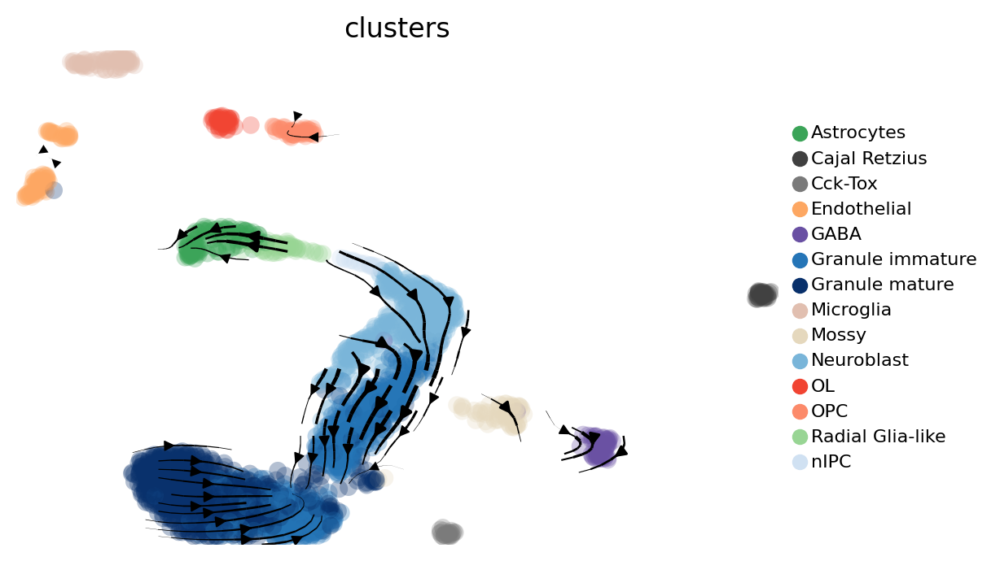

In [32]:
#- clustering and embedding (get UMAP embeddings and annotated clusters)
scv.tl.umap(adata_dent)
scv.tl.louvain(adata_dent)
scv.pl.velocity_embedding_stream(adata_dent, basis='umap', 
                                 color='clusters', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')

In [33]:
#- INTERPRET the velocity estimates by identifying important/top genes - PHASE PORTRAITS of some markers
scv.tl.rank_velocity_genes(adata_dent, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata_dent.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:02) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Astrocytes,Cajal Retzius,Cck-Tox,Endothelial,GABA,Granule immature,Granule mature,Microglia,Mossy,Neuroblast,OL,OPC,Radial Glia-like,nIPC
0,Phkg1,Dpysl3,Golga7b,Serpine2,Vsnl1,Shisa9,Sgsm2,Srgap2,Chgb,Mt3,Gprc5b,Hmgcs1,2810459M11Rik,Smarcc1
1,Ctnnd2,Tmem47,Rab3c,Ptprg,Lancl1,Jph1,Ntng1,Clic4,Pgm2l1,Gdpd1,Clmn,Luzp2,Hepacam,Igfbpl1
2,Lsamp,Sh3glb1,Irf9,Prex2,Mtus2,Sphkap,Grasp,Ssh2,Fxyd1,Slc38a2,Pcdh9,Ppp1r14c,Ctnnd2,Bzw2
3,Qk,Scg3,Cplx2,Arhgap31,Stmn2,Pgbd5,2010300C02Rik,Qk,Mapk6,Bzw2,Gatm,Elavl3,Sparcl1,Tbrg4
4,Cspg5,Pacrg,Ptprd,Arrdc2,Elavl3,Gabrb3,Wasf1,Hn1,Osbpl6,Epha4,Tmeff2,Lsamp,Lsamp,Rps27l


In [ ]:
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)
df.to_csv("dentate_gyrus/rank_velocity_genes_dentate_gyrus.csv", sep='\t')

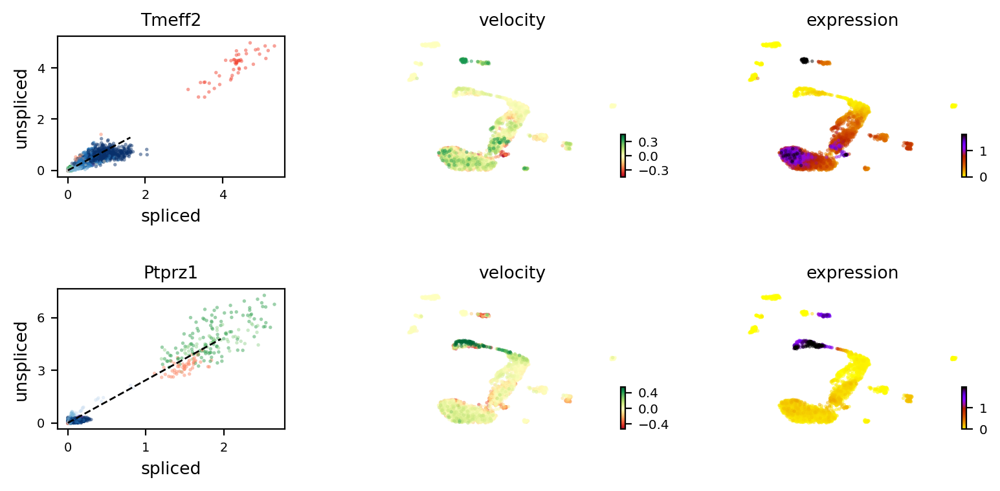

In [34]:
#- phase portraits of genes in the G1 phase which show up in the p53 signalling pathway (according to PANTHER db)
scv.pl.velocity(adata_dent, ['Tmeff2',  'Ptprz1'], ncols=1, color = 'clusters', colorbar=True)

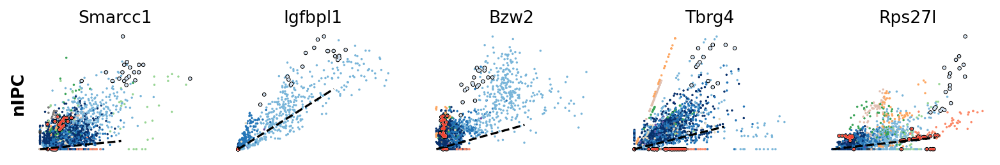

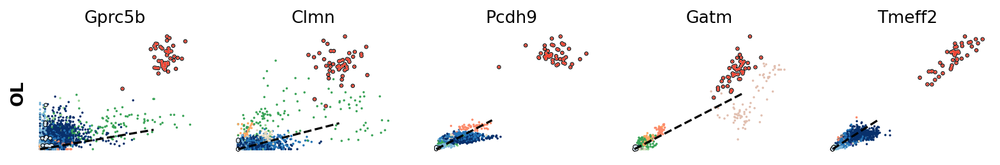

In [35]:
kwargs = dict(frameon=False, size=10, linewidth=1.5, 
              add_outline='nIPC , OL')

scv.pl.scatter(adata_dent, df['nIPC'][:5], ylabel='nIPC', **kwargs)
scv.pl.scatter(adata_dent, df['OL'][:5], ylabel='OL', **kwargs)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


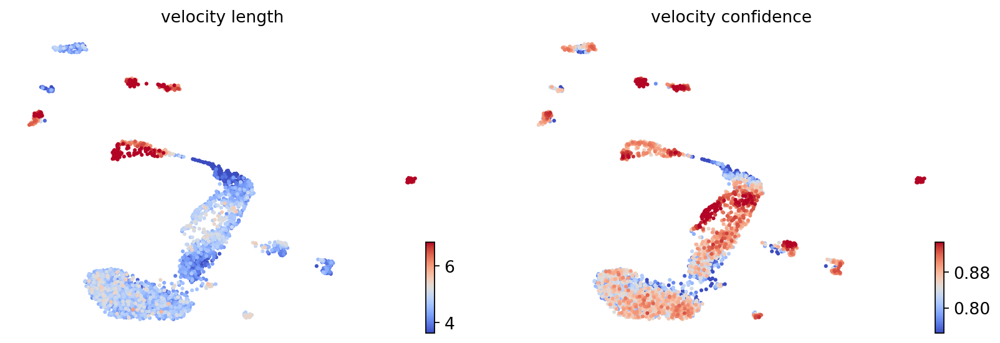

In [ ]:
#- speed (by length of velocity vector) and coherence - how a velocity vector correlates with its neighboring velocities, provides a measure of confidence.
scv.tl.velocity_confidence(adata_dent)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_dent, c=keys, cmap='coolwarm', perc=[5, 95], colorbar=True)

In [ ]:
df1 = adata_dent.obs.groupby('clusters')[keys].mean().T
df1.style.background_gradient(cmap='coolwarm', axis=1)

clusters,Astrocytes,Cajal Retzius,Cck-Tox,Endothelial,GABA,Granule immature,Granule mature,Microglia,Mossy,Neuroblast,OL,OPC,Radial Glia-like,nIPC
velocity_length,6.894834,6.836765,5.143333,5.697931,4.050820,4.333694,4.515224,4.281481,4.521067,4.260623,6.957600,6.482264,5.972549,3.084737
velocity_confidence,0.899229,0.983757,0.888597,0.867098,0.877451,0.851931,0.817038,0.861059,0.875730,0.870156,0.943305,0.923774,0.901141,0.749565


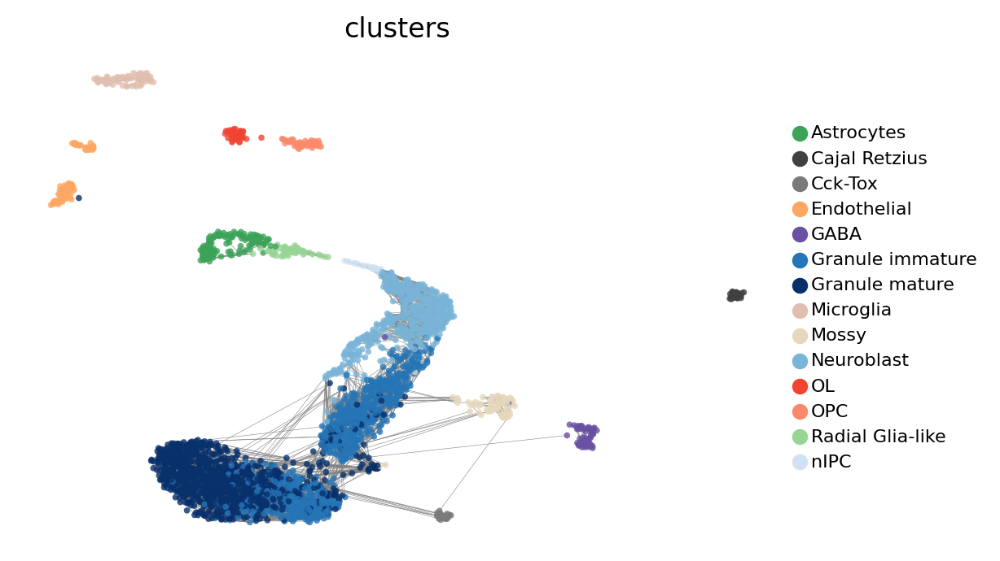

In [ ]:
#- velocity graph to portray all velocity-inferred cell-to-cell connections/transitions
scv.pl.velocity_graph(adata_dent, threshold=.2, color='clusters', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

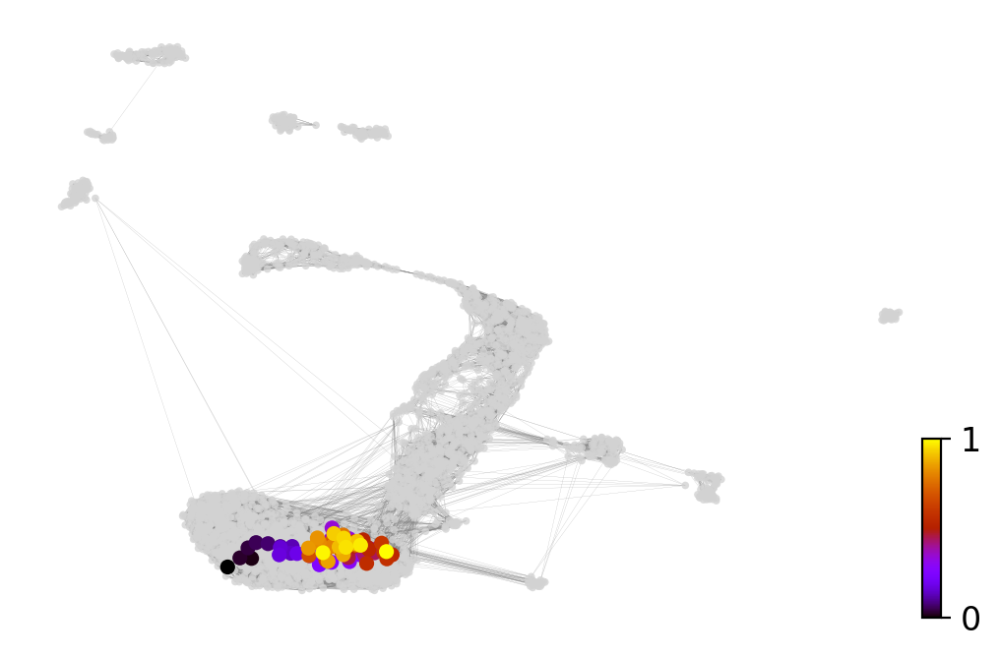

In [ ]:
#- Further, the graph can be used to draw descendents/anscestors coming from a specified cell - neural G0
x, y = scv.utils.get_cell_transitions(adata_dent, basis='umap', starting_cell=2)
ax = scv.pl.velocity_graph(adata_dent, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_dent, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [ ]:
#- PAGA velocity graph - gives velocity-inferred directionality
!pip install python-igraph --upgrade --quiet

In [ ]:
# this is needed due to a current bug - bugfix is coming soon.
adata_dent.uns['neighbors']['distances'] = adata_dent.obsp['distances']
adata_dent.uns['neighbors']['connectivities'] = adata_dent.obsp['connectivities']

scv.tl.paga(adata_dent, groups='clusters')
df2 = scv.get_df(adata_dent, 'paga/transitions_confidence', precision=2).T
df2.style.background_gradient(cmap='Blues').format('{:.2g}')


computing terminal states
    identified 5 regions of root cells and 5 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0.45,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0.031,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1.7,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0.17,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0.24,0,0,0,0,0,0,0,0


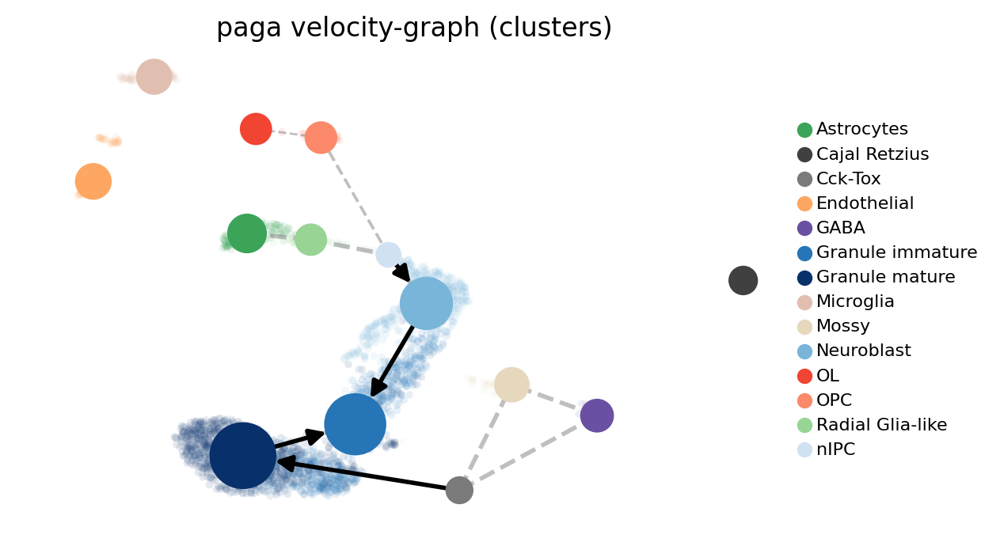

In [ ]:
scv.pl.paga(adata_dent, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, threshold=.2, color='clusters', 
            xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

In [ ]:
#- DYNAMICAL model - to learn the full transcriptional dynamics of splicing kinetics
# - can take long to run
scv.tl.recover_dynamics(adata_dent)
scv.tl.velocity(adata_dent, mode="dynamical")

scv.tl.velocity_graph(adata_dent)

# adata_dent.write('dentate_gyrus/dentate_gyrus_dynamical_model.h5ad')

recovering dynamics (using 1/2 cores)


  0%|          | 0/557 [00:00<?, ?gene/s]

    finished (0:03:58) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/2 cores)


  0%|          | 0/2930 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


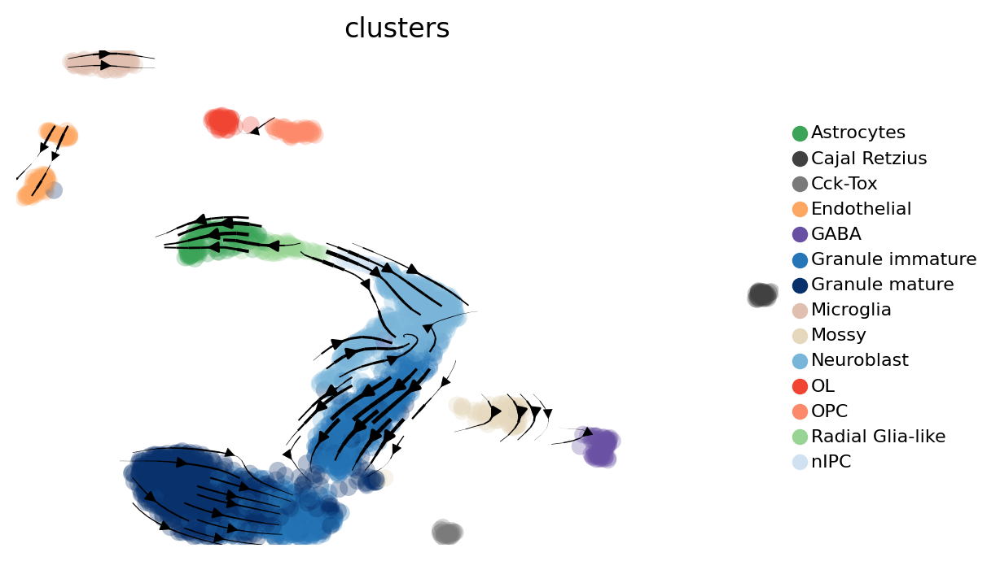

In [ ]:
scv.pl.velocity_embedding_stream(adata_dent, basis='umap', 
                                 color='clusters', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')


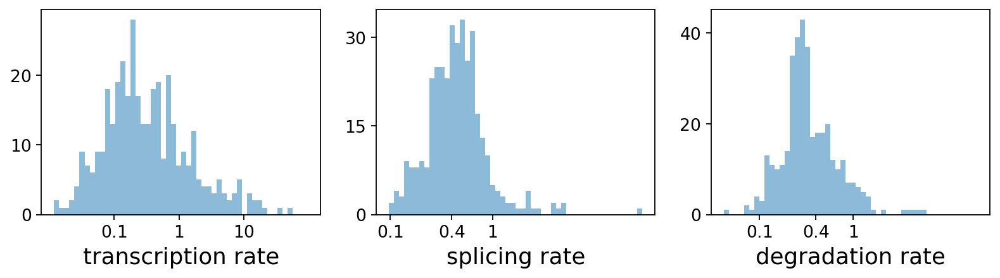

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
index,,,,,,,,,,,,,,,,
Prex2,0.09,0.06,0.11,17.80,2.35,0.31,0.11,2.37e-01,0.0,0.0,0.47,1.04,0.49,0.75,5.69,0.82
A830018L16Rik,0.04,0.12,0.14,16.24,2.21,0.11,0.06,2.66e-01,0.0,0.0,0.17,0.39,0.18,0.78,4.99,0.25
Paqr8,0.08,0.10,0.12,15.21,3.78,0.21,0.09,1.92e-01,0.0,0.0,0.46,0.70,0.35,0.65,4.72,0.62
Tmeff2,1.70,1.05,0.89,5.63,0.36,0.34,0.42,1.18e-79,0.0,0.0,0.50,3.55,3.67,1.75,1.21,0.90
Gm10561,1.09,1.64,1.34,2.40,0.56,0.23,0.21,2.71e-01,0.0,0.0,0.31,0.51,0.50,0.29,0.56,0.89


In [ ]:
#- kinetic rate parameters
df4 = adata_dent.var
df4 = df4[(df4['fit_likelihood'] > .1) & df4['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df4['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df4['fit_beta'] * df4['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)    
    pl.hist(df4['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    
scv.get_df(adata_dent, 'fit*', dropna=True).head()

In [ ]:
x = scv.get_df(adata_dent, 'fit*', dropna=True)
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)
x.to_csv("dentate_gyrus/kinetic_rate_params_dentate_gyrus.csv", sep='\t')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


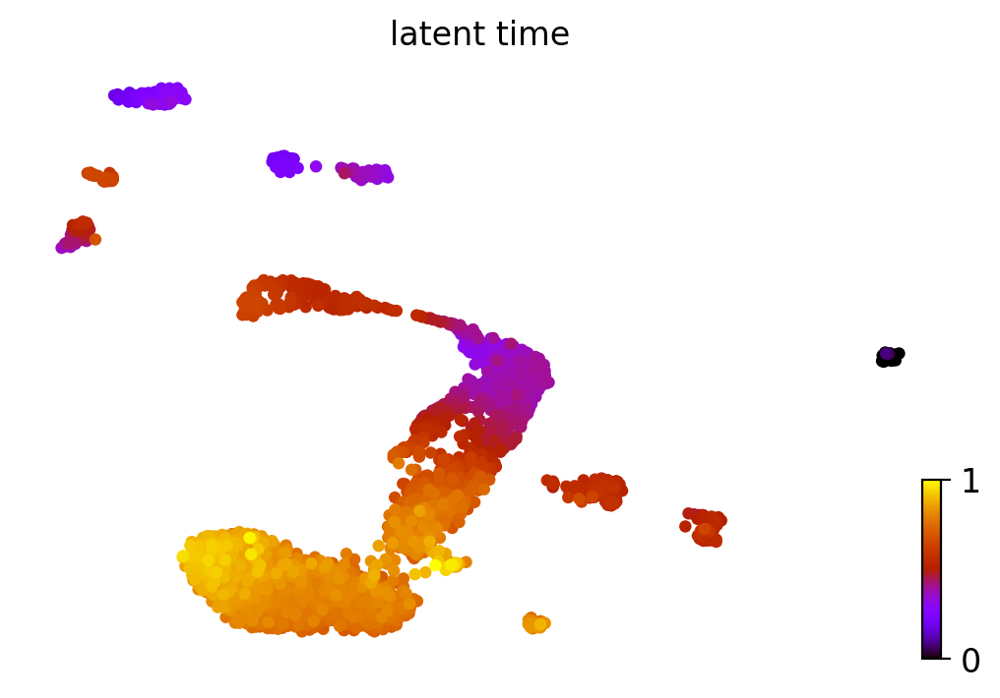

In [ ]:
#- latent time
scv.tl.latent_time(adata_dent)
scv.pl.scatter(adata_dent, color='latent_time', color_map='gnuplot', size=80)


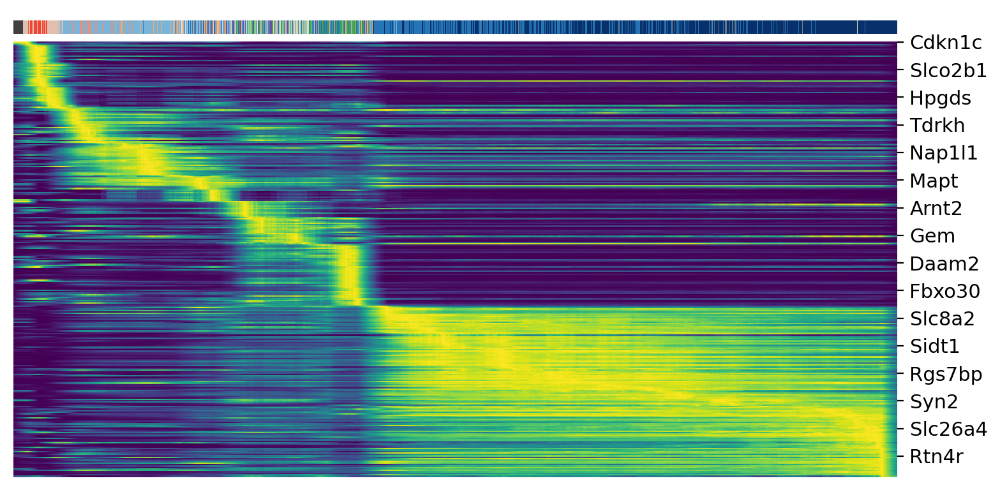

In [ ]:

top_genes = adata_dent.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_dent, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100)


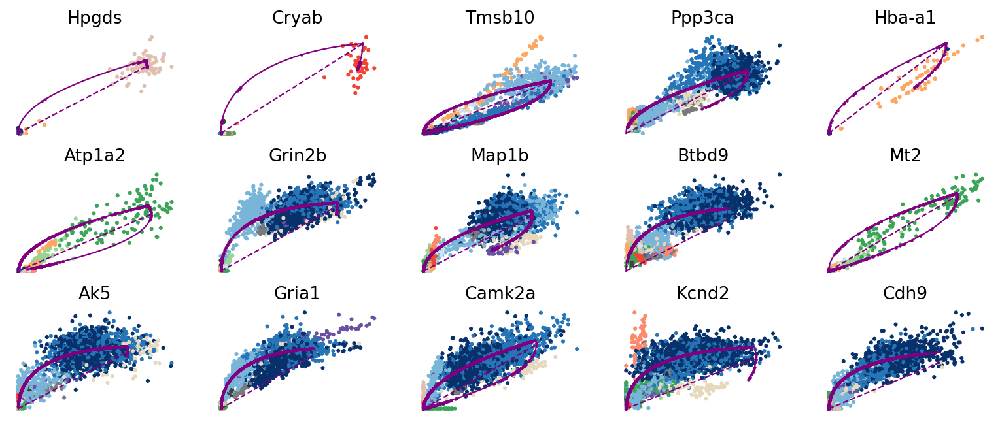

In [ ]:
top_genes = adata_dent.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_dent, basis=top_genes[:15], ncols=5, frameon=False)


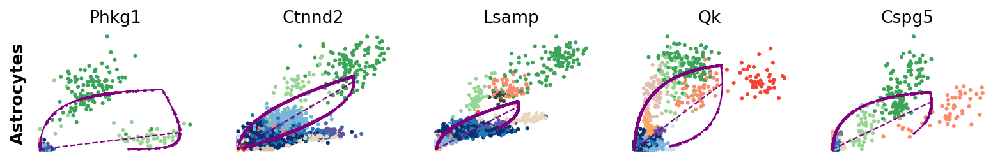

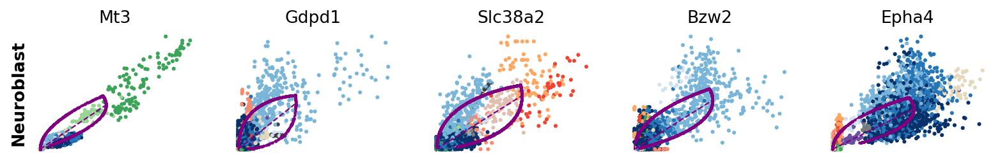

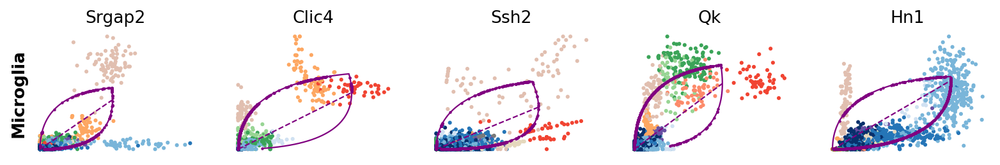

In [ ]:
for cluster in ['Astrocytes', 'Neuroblast', 'Microglia']:
    scv.pl.scatter(adata_dent, df[cluster][:5], ylabel=cluster, frameon=False)

In [ ]:
df_hnsc = pd.read_csv("hNSC/rank_velocity_genes_hNSC.csv", sep='\t')
df_hnsc = df_hnsc.drop(df_hnsc.columns[0], axis=1)
df_hnsc.head()

,G1/other,Neural G0,G1,Late G1,S,S/G2,G2/M,M/Early G1
0,CALD1,LRRC4C,SAT1,TMEFF2,NCAPG,NEIL3,IGFBP5,IGFBP5
1,LMNA,COL11A1,PPP2R2B,AKAP12,DCBLD2,ANLN,NEIL3,TROAP
2,SNRPB,CITED1,CENPK,KCNIP1,ANLN,KIF4A,KPNA2,LHFP
3,TK1,CSGALNACT1,CSGALNACT1,DCBLD2,KIF11,CENPE,NCAPD2,CENPW
4,TPM1,AKAP12,LRRC4C,ATAD2,SPC25,PRC1,CENPA,CCNB1


In [ ]:
df = df.str.upper()
df.head()

,Astrocytes,Cajal Retzius,Cck-Tox,Endothelial,GABA,Granule immature,Granule mature,Microglia,Mossy,Neuroblast,OL,OPC,Radial Glia-like,nIPC
0,Phkg1,Dpysl3,Golga7b,Serpine2,Vsnl1,Shisa9,Sgsm2,Srgap2,Chgb,Mt3,Gprc5b,Hmgcs1,2810459M11Rik,Smarcc1
1,Ctnnd2,Tmem47,Rab3c,Ptprg,Lancl1,Jph1,Ntng1,Clic4,Pgm2l1,Gdpd1,Clmn,Luzp2,Hepacam,Igfbpl1
2,Lsamp,Sh3glb1,Irf9,Prex2,Mtus2,Sphkap,Grasp,Ssh2,Fxyd1,Slc38a2,Pcdh9,Ppp1r14c,Ctnnd2,Bzw2
3,Qk,Scg3,Cplx2,Arhgap31,Stmn2,Pgbd5,2010300C02Rik,Qk,Mapk6,Bzw2,Gatm,Elavl3,Sparcl1,Tbrg4
4,Cspg5,Pacrg,Ptprd,Arrdc2,Elavl3,Gabrb3,Wasf1,Hn1,Osbpl6,Epha4,Tmeff2,Lsamp,Lsamp,Rps27l


In [ ]:
#- no genes overlap with human neural stem cells
overlap_dent_hnsc = df.isin(df_hnsc)
overlap_dent_hnsc
overlap_dent_hnsc.value_counts()

Astrocytes  Cajal Retzius  Cck-Tox  Endothelial  GABA   Granule immature  Granule mature  Microglia  Mossy  Neuroblast  OL     OPC    Radial Glia-like  nIPC 
False       False          False    False        False  False             False           False      False  False       False  False  False             False    100
dtype: int64

MOUSE NEURONAL SPLICING DATASET

> https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE141851



In [ ]:
# !git clone https://github.com/aristoteleo/dynamo-release.git
# !cd dynamo-release/
os.chdir('/content/drive/.shortcut-targets-by-id/1YhCL_QIIgg4n_U80clweV8W0_YlLpu0S/pallavi/data/dynamo-release/')
!python setup.py install --user

In [ ]:
!pip3 install numdifftools==0.9.39
import numdifftools as nd
!pip3 install nxviz==0.7.2
!pip install KDEpy

In [13]:
import dynamo as dyn
# dyn.get_all_dependencies_version()

In [14]:
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1YhCL_QIIgg4n_U80clweV8W0_YlLpu0S/pallavi/data/dynamo-release'

In [15]:
#- The neuron splicing data is from Qiu, et al (2020). This data consists of 44,021 genes across 13,476 cells.
adata_neur = dyn.sample_data.scNT_seq_neuron_splicing()
adata_neur

|-----> Downloading data to ./data/neuron_splicing.h5ad


AnnData object with n_obs × n_vars = 4181 × 16940
    obs: 'split_id', 'sample', 'Size_Factor', 'condition', 'Cluster', 'Cell_type', 'umap_1', 'umap_2', 'batch'
    layers: 'spliced', 'unspliced'

In [16]:
adata_neur.obs.Cell_type.unique()


['Schwann Cell', 'Unknown', 'Neuron', 'Satellite Glia', 'Melanophore', ..., 'Proliferating Progenitor', 'Xanthophore', 'Pigment Progenitor', 'Chromaffin', 'Other Glia']
Length: 12
Categories (12, object): ['Chromaffin', 'Iridophore', 'Melanophore', 'Neuron', ..., 'Schwann Cell',
                          'Schwann Cell Precursor', 'Unknown', 'Xanthophore']

In [ ]:
!pip install matplotlib==3.0.3 --quiet #- needs a specific plt version for the plots to show up

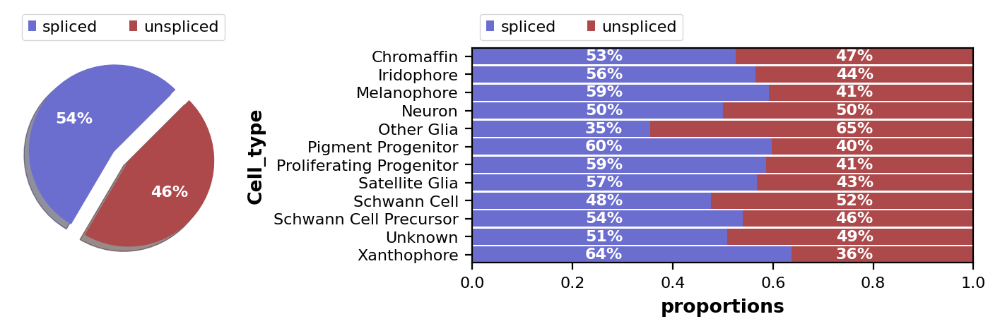

In [19]:
#- The proportions of spliced/unspliced counts are displayed
#- Depending on sequencing technology, we typically expect 10%-25% of unspliced molecules containing intronic sequences
scv.pl.proportions(adata_neur, groupby='Cell_type')

In [20]:
#- preprocess data
#- filter and normalize - select genes by minimum number of counts and dispersion normalizing every cell by its total size and logarithmizing it.
#- Further, we need the first and second order moments (means and uncentered variances) computed among nearest neighbors in PCA space, summarized in scv.pp.moments, which internally computes scv.pp.pca and scv.pp.neighbors. 
#- First order is needed for deterministic velocity estimation, while stochastic estimation also requires second order moments.
#- if the datasets are already preprocessed then it skips it intrinsically
scv.pp.filter_and_normalize(adata_neur, min_shared_counts=20, n_top_genes=2000) #- just using default metrics
scv.pp.moments(adata_neur, n_pcs=30, n_neighbors=30)

Filtered out 11388 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [23]:
#- Estimate RNA velocity now (ratio of unspliced/splcied mRNA); -ve Velocity = downregulated genes
#- They represent direction and speed of movement of individual cells - hence applied to single cell RNA seq datasets
#- Can be STOCHASTICALLY (mode="stochastic") | DETERMINISTCIALLY (mode="deterministic") | DYNAMICAL (mode="dynamical")
scv.tl.velocity(adata_neur, mode="stochastic")

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [22]:
scv.tl.velocity_graph(adata_neur)

computing velocity graph (using 1/2 cores)


  0%|          | 0/4181 [00:00<?, ?cells/s]

    finished (0:00:19) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


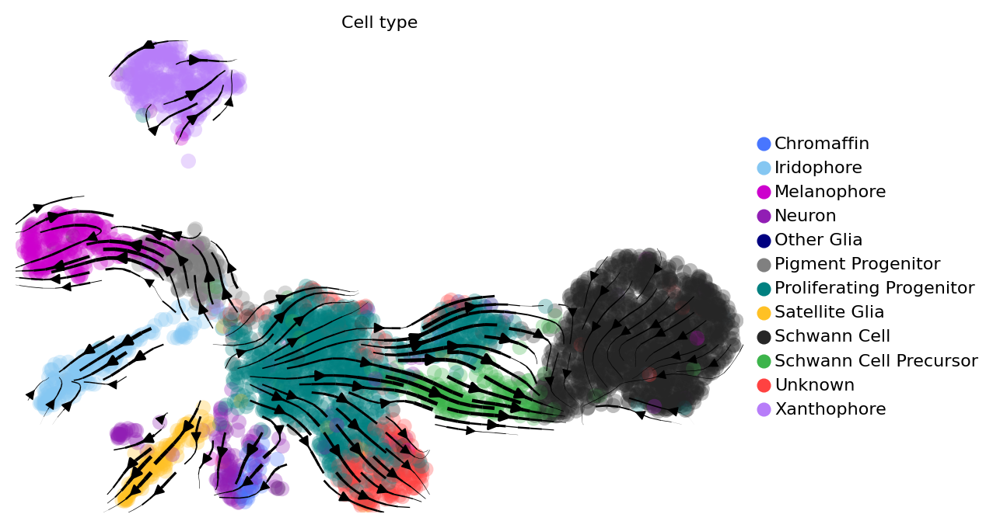

In [24]:
#- clustering and embedding (get UMAP embeddings and annotated clusters)
scv.tl.umap(adata_neur)
scv.tl.louvain(adata_neur)
scv.pl.velocity_embedding_stream(adata_neur, basis='umap', 
                                 color='Cell_type', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')

In [25]:
#- INTERPRET the velocity estimates by identifying important/top genes - PHASE PORTRAITS of some markers
scv.tl.rank_velocity_genes(adata_neur, groupby='Cell_type', min_corr=.3)

df = scv.DataFrame(adata_neur.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Chromaffin,Iridophore,Melanophore,Neuron,Other Glia,Pigment Progenitor,Proliferating Progenitor,Satellite Glia,Schwann Cell,Schwann Cell Precursor,Unknown,Xanthophore
0,slit3,pdzrn3b,lmo7a,pcdh19,COL18,sox4a,erbb3b,arhgef4,nfia,cux1a,DAB2,slc22a2
1,pcdh1b,lpcat1,trpm1b,tshz3b,stard8,igsf11,DAB2,atp1a1b,cadm1b,adgrb1a,fam13b,slc22a7a
2,nrxn1a,syne1b,rgs12b,fam49al,flrt2,slc45a2,mllt4a,bcl11ba,epha7,adgrg6,tm4sf18,slc2a15b
3,palm1a,si:ch211-243a20.3,si:zfos-943e10.1,pcdh1b,entpd3,rab32a,hspg2,mlc1,mag,ptk2ab,prex2,aox5
4,tshz3b,kcnip3b,prdx1,palm1a,ncam1b,mef2cb,mef2aa,cspg5a,timd4,cadm4,mef2aa,zgc:110789


In [ ]:
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)
df.to_csv("neuronal_splicing/rank_velocity_genes_neuronal_splicing.csv", sep='\t')

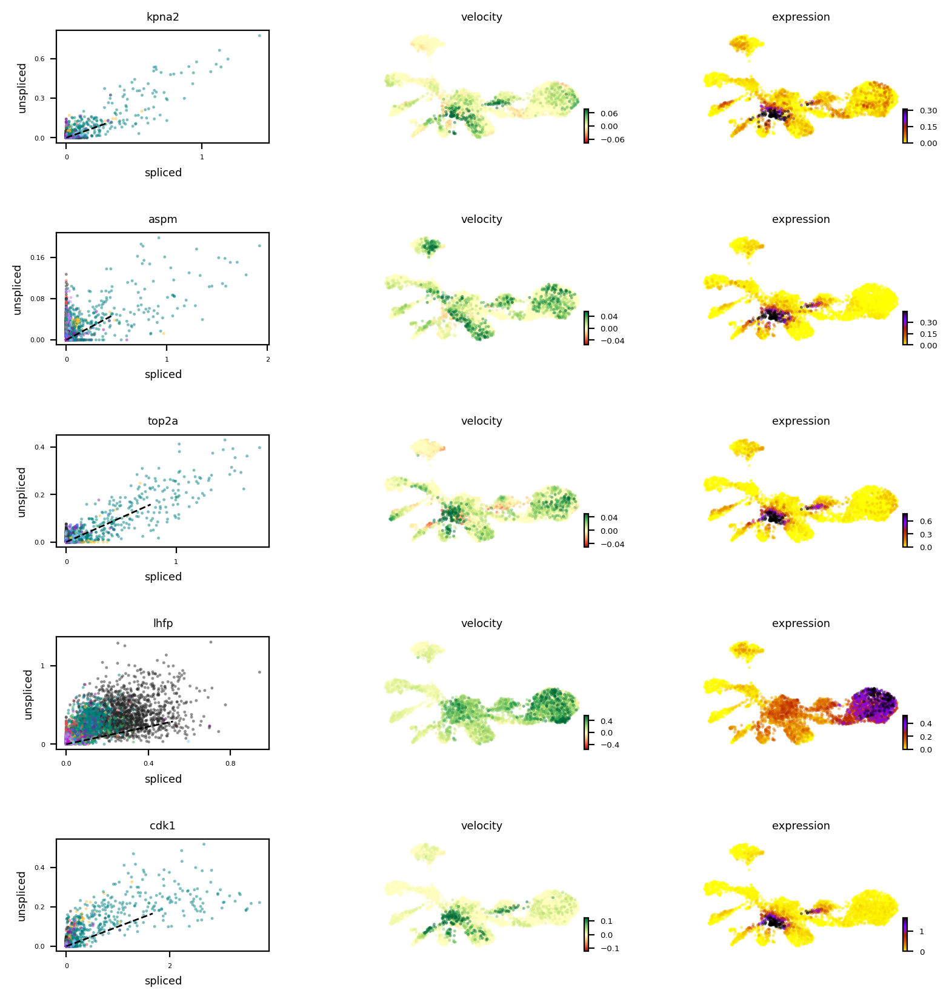

In [26]:
#- phase portraits of genes in the G1 phase which show up in the p53 signalling pathway (according to PANTHER db)
scv.pl.velocity(adata_neur, ['kpna2',  'aspm', 'top2a', 'lhfp', 'cdk1'], ncols=1, color = 'Cell_type', colorbar=True)

In [ ]:
adata_neur.obs.Cell_type.unique()

['Schwann Cell', 'Unknown', 'Neuron', 'Satellite Glia', 'Melanophore', ..., 'Proliferating Progenitor', 'Xanthophore', 'Pigment Progenitor', 'Chromaffin', 'Other Glia']
Length: 12
Categories (12, object): ['Chromaffin', 'Iridophore', 'Melanophore', 'Neuron', ..., 'Schwann Cell',
                          'Schwann Cell Precursor', 'Unknown', 'Xanthophore']

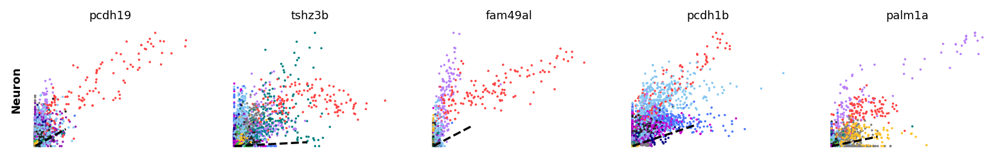

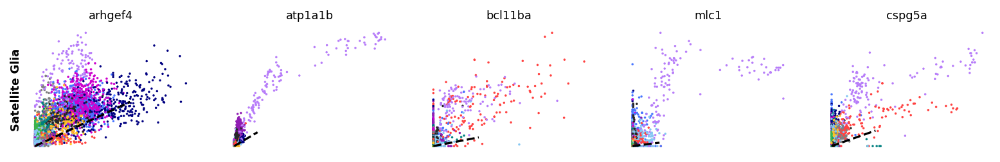

In [ ]:
kwargs = dict(frameon=False, size=10, linewidth=1.5, 
              add_outline='Astrocytes , Neuroblast')

scv.pl.scatter(adata_neur, df['Neuron'][:5], ylabel='Neuron', **kwargs)
scv.pl.scatter(adata_neur, df['Satellite Glia'][:5], ylabel='Satellite Glia', **kwargs)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


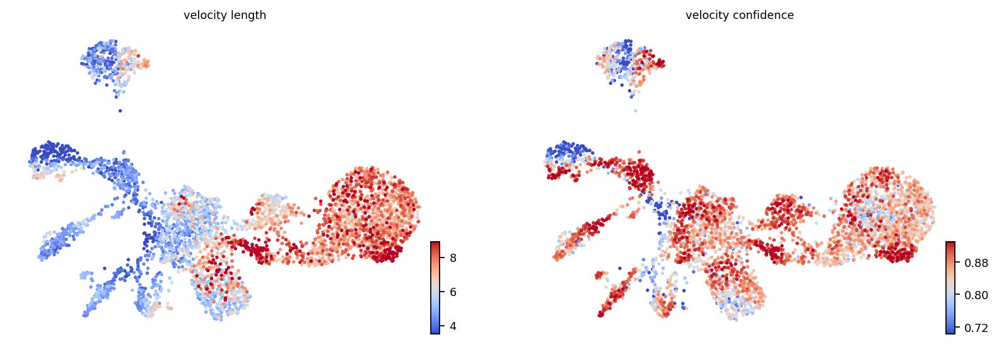

In [ ]:
#- speed (by length of velocity vector) and coherence - how a velocity vector correlates with its neighboring velocities, provides a measure of confidence.
scv.tl.velocity_confidence(adata_neur)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_neur, c=keys, cmap='coolwarm', perc=[5, 95], colorbar=True)

In [ ]:
df1 = adata_neur.obs.groupby('Cell_type')[keys].mean().T
df1.style.background_gradient(cmap='coolwarm', axis=1)

Cell_type,Chromaffin,Iridophore,Melanophore,Neuron,Other Glia,Pigment Progenitor,Proliferating Progenitor,Satellite Glia,Schwann Cell,Schwann Cell Precursor,Unknown,Xanthophore
velocity_length,5.761765,4.529040,4.084706,4.905255,6.025000,4.135232,5.684814,4.399683,7.494294,8.193619,5.960882,4.847516
velocity_confidence,0.874039,0.870789,0.795781,0.809546,0.772622,0.885446,0.864172,0.874458,0.840751,0.879925,0.819929,0.781090


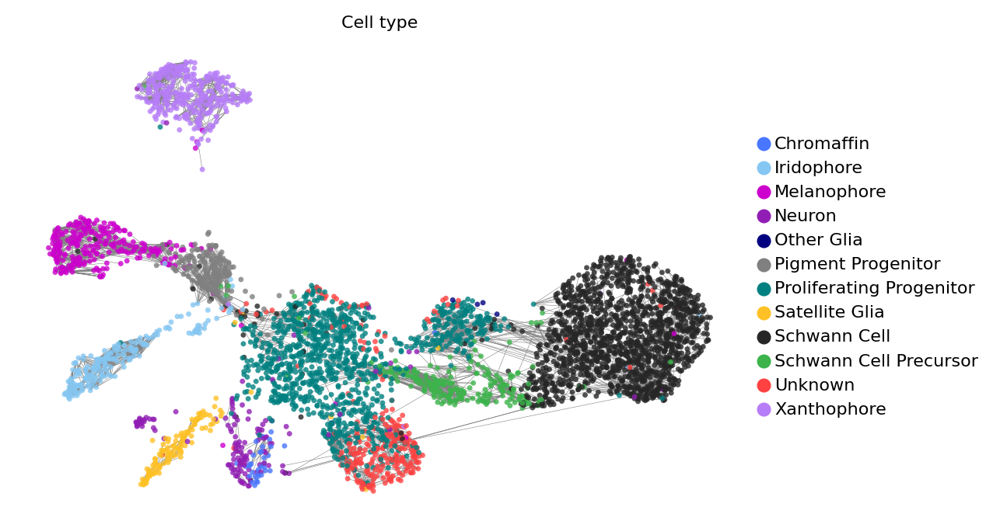

In [ ]:
#- velocity graph to portray all velocity-inferred cell-to-cell connections/transitions
scv.pl.velocity_graph(adata_neur, threshold=.2, color='Cell_type', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

In [ ]:
adata_neur.obs #- using 3rd cell - schwann cell

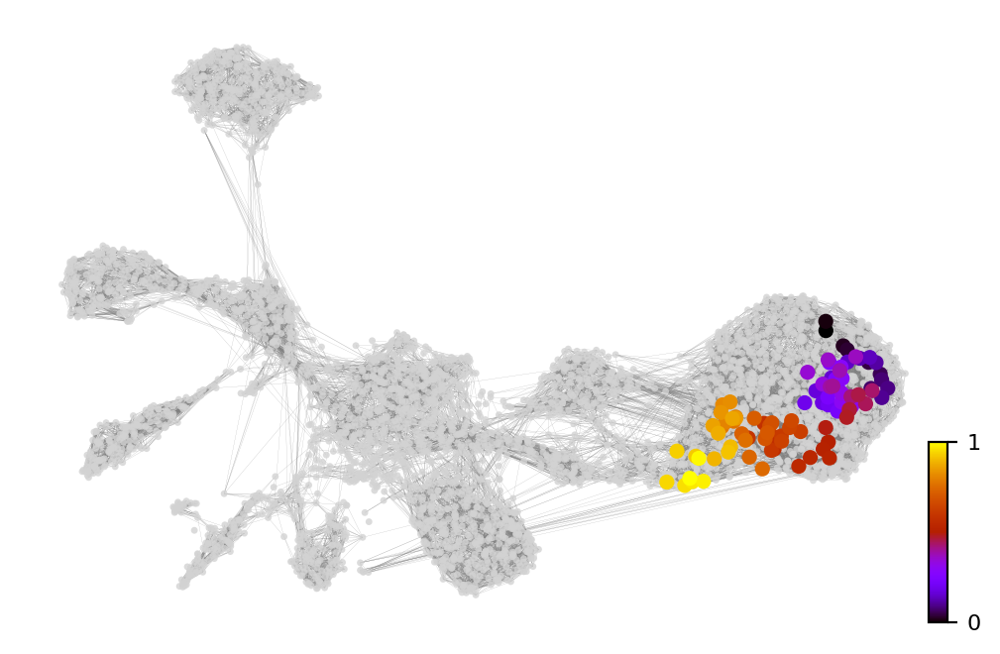

In [ ]:
#- Further, the graph can be used to draw descendents/anscestors coming from a specified cell - neural G0
x, y = scv.utils.get_cell_transitions(adata_neur, basis='umap', starting_cell=3)
ax = scv.pl.velocity_graph(adata_neur, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_neur, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [ ]:
#- PAGA velocity graph - gives velocity-inferred directionality
!pip install python-igraph --upgrade --quiet

In [ ]:
# this is needed due to a current bug - bugfix is coming soon.
adata_neur.uns['neighbors']['distances'] = adata_neur.obsp['distances']
adata_neur.uns['neighbors']['connectivities'] = adata_neur.obsp['connectivities']

scv.tl.paga(adata_neur, groups='Cell_type')
df2 = scv.get_df(adata_neur, 'paga/transitions_confidence', precision=2).T
df2.style.background_gradient(cmap='Blues').format('{:.2g}')


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:04) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11
0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0.026,0,0,0,0,0,0
2,0,0,0,0,0,0.064,0,0,0,0,0,0
3,0.045,0,0,0,0,0.024,0,0,0.098,0,0,0
4,0,0,0,0,0,0,0,0,0.14,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0.22,0,0
7,0,0,0,0.026,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0.24,0,0,0


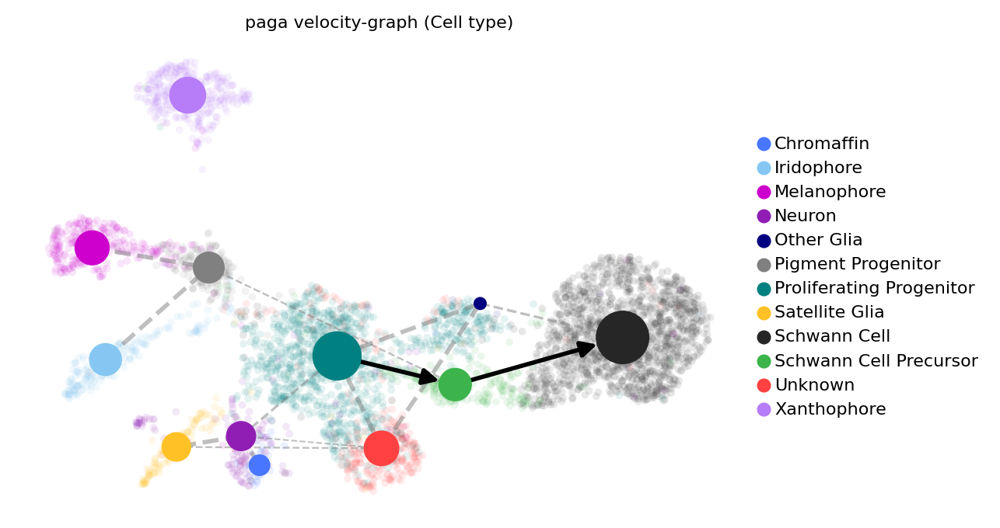

In [ ]:
scv.pl.paga(adata_neur, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, threshold=.2, color='Cell_type', 
            xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8)

In [ ]:
#- DYNAMICAL model - to learn the full transcriptional dynamics of splicing kinetics
# - can take long to run
scv.tl.recover_dynamics(adata_neur)
scv.tl.velocity(adata_neur, mode="dynamical")

recovering dynamics (using 1/2 cores)


  0%|          | 0/599 [00:00<?, ?gene/s]

    finished (0:06:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [ ]:
os.chdir('/content/drive/.shortcut-targets-by-id/1YhCL_QIIgg4n_U80clweV8W0_YlLpu0S/pallavi/data/')

In [ ]:
scv.tl.velocity_graph(adata_neur)
adata_neur.write('neuronal_splicing/neuronal_splicing_dynamical_model.h5ad')

computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


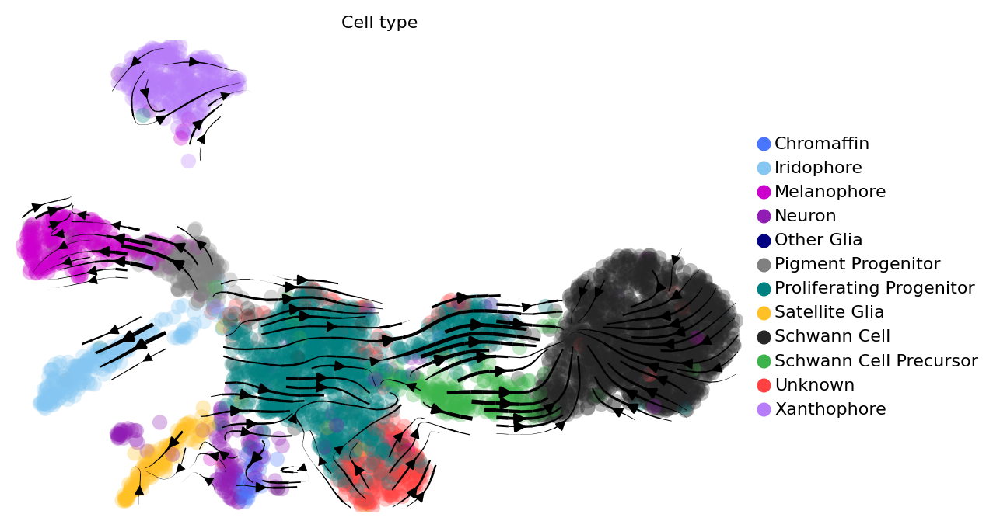

In [ ]:
scv.pl.velocity_embedding_stream(adata_neur, basis='umap', 
                                 color='Cell_type', xlabel=False, ylabel=True, legend_loc='right margin', legend_fontsize=8, integration_direction='forward')


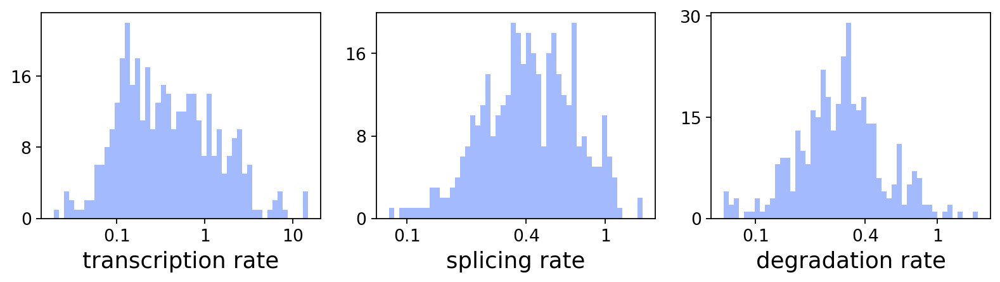

,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
gfap,37.22,88.46,1.12,13.21,0.02,0.10,8.62,2.07e-01,0.0,0.0,0.50,0.41,23.35,0.58,0.96,0.91
ptmab,6.55,26.21,0.34,9.10,0.02,0.09,4.99,1.83e-01,0.0,0.0,0.50,0.24,16.65,1.43,2.04,0.29
cotl1,2.48,11.59,0.32,9.76,0.06,0.09,2.38,1.80e-01,0.0,0.0,0.49,0.26,5.21,0.76,2.06,0.18
dnajb11,0.44,4.35,0.29,3.20,0.18,0.02,0.20,1.16e-05,0.0,0.0,0.48,0.07,0.55,1.73,1.85,0.14
elovl7a,1.12,13.65,0.45,3.95,0.09,0.02,0.34,6.86e-06,0.0,0.0,0.49,0.07,1.18,1.05,1.07,0.07


In [ ]:
#- kinetic rate parameters
df4 = adata_neur.var
df4 = df4[(df4['fit_likelihood'] > .1) & df4['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df4['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df4['fit_beta'] * df4['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)    
    pl.hist(df4['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)
    
scv.get_df(adata_neur, 'fit*', dropna=True).head()

computing latent time using root_cells as prior
    finished (0:00:03) --> added 
    'latent_time', shared time (adata.obs)


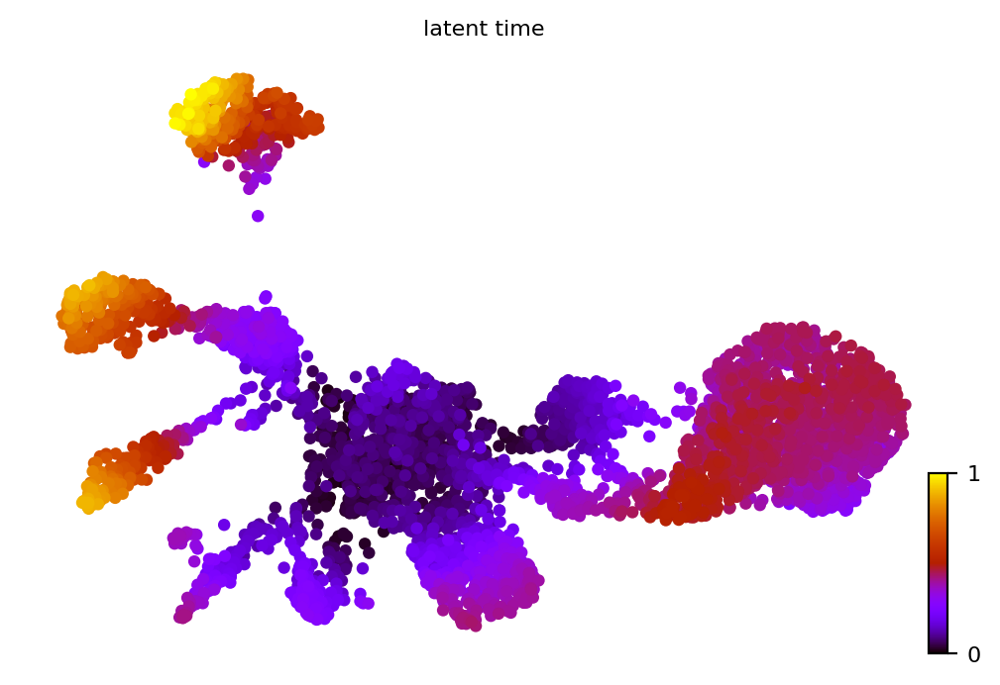

In [ ]:
#- latent time
scv.tl.latent_time(adata_neur)
scv.pl.scatter(adata_neur, color='latent_time', color_map='gnuplot', size=80)

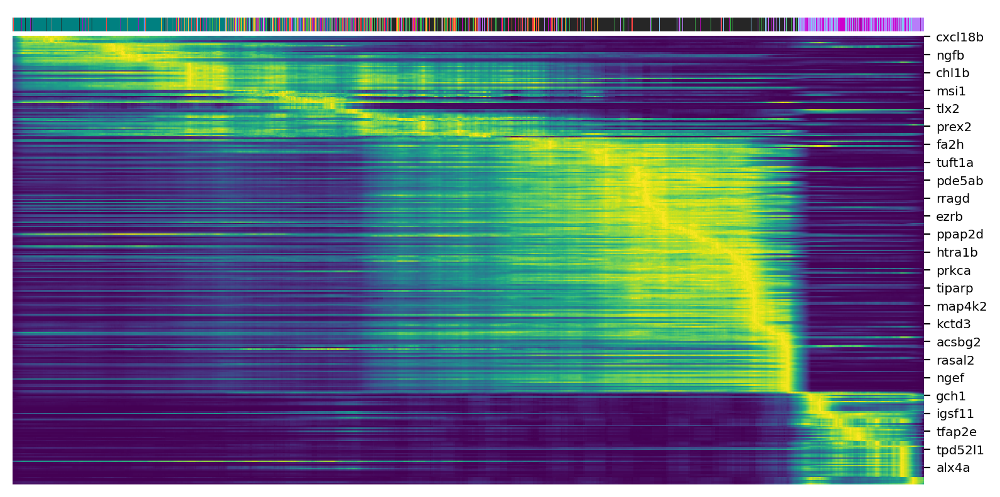

In [ ]:
top_genes = adata_neur.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_neur, var_names=top_genes, sortby='latent_time', col_color='Cell_type', n_convolve=100)


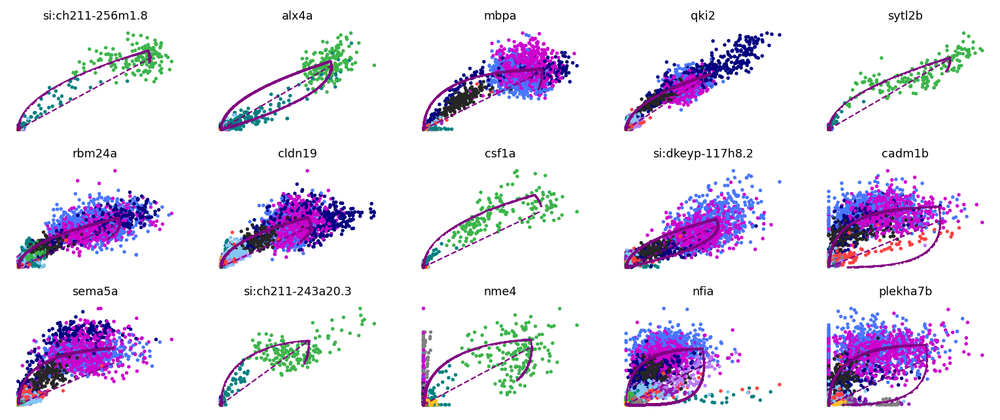

In [ ]:
top_genes = adata_neur.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_neur, basis=top_genes[:15], ncols=5, frameon=False)


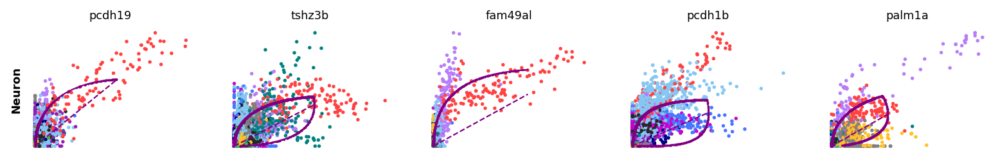

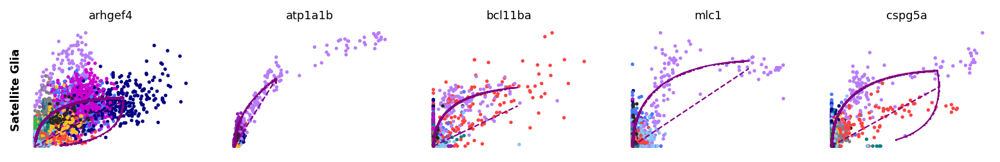

In [ ]:
for cluster in ['Neuron', 'Satellite Glia']:
    scv.pl.scatter(adata_neur, df[cluster][:5], ylabel=cluster, frameon=False)

In [ ]:
x = scv.get_df(adata_neur, 'fit*', dropna=True)
path ="/content/drive/MyDrive/SBU_courses/BMI_520/pallavi/data/"
os.chdir(path)
x.to_csv("neuronal_splicing/kinetic_rate_params_neuronal_splicing.csv", sep='\t')